<a href="https://colab.research.google.com/github/deepakri201/nlst_explore/blob/main/Exploratory_analysis_NLST_126k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook explores the 126k series NLST results.

SELECT
DISTINCT(findingSite.CodeMeaning)
FROM
`idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`

CodeMeaning
Adrenal gland
Aorta
Brain
C1 vertebra
C2 vertebra
C3 vertebra
C4 vertebra
C5 vertebra
C6 vertebra
C7 vertebra
Clavicle
Colon
Common iliac artery
Common iliac vein
Deep muscle of back
Duodenum
Eighth rib
Eleventh rib
Esophagus
Face
Femur
Fifth rib
First rib
Fourth rib
Gallbladder
Gluteus maximus muscle
Gluteus medius muscle
Gluteus minius muscle
Hip
Humerus
Iliopsoas muscle
Inferior vena cava
Kidney
L1 vertebra
L2 vertebra
L3 vertebra
L4 vertebra
L5 vertebra
Left atrium
Left ventricle of heart
Liver
Lower lobe of lung
Middle lobe of right lung
Myocardium
Ninth rib
Pancreas
Portal vein and splenic vein
Pulmonary artery
Right atrium
Right ventricle of heart
Sacrum
Scapula
Second rib
Seventh rib
Sixth rib
Small Intestine
Spleen
Stomach
T1 vertebra
T10 vertebra
T11 vertebra
T12 vertebra
T2 vertebra
T3 vertebra
T4 vertebra
T5 vertebra
T6 vertebra
T7 vertebra
T8 vertebra
T9 vertebra
Tenth rib
Third rib
Trachea
Twelfth rib
Upper lobe of lung
Urinary bladder

SELECT
DISTINCT(Quantity.CodeMeaning)
FROM
`idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`
ORDER BY Quantity.CodeMeaning ASC


10th percentile
90th percentile
Approximate volume
Elongation
Energy
Flatness
Intensity histogram entropy
Intensity histogram uniformity
Interquartile range
Least axis length
Major axis length
Maximum 3D diameter
Maximum grey level
Mean
Mean absolute deviation
Median
Minimum grey level
Minor axis length
Range
Robust mean absolute deviation
Root mean square
Skewness
Sphericity
Surface area
Surface to volume ratio
Variance
Volume

In [ ]:
#@title Enter your Project ID here
# initialize this variable with your Google Cloud Project ID!
project_name = "idc-external-018" #@param {type:"string"}

import os
os.environ["GCP_PROJECT_ID"] = project_name

!gcloud config set project $project_name

from google.colab import auth
auth.authenticate_user()

Updated property [core/project].


# Environment setup

In [ ]:
import os
import sys
import time
import json
import subprocess
import glob
import shutil

import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
pd.options.mode.chained_assignment = None

import seaborn as sb
import db_dtypes

from google.cloud import bigquery
from google.cloud import storage

from collections import OrderedDict

import seaborn as sns

from pathlib import Path

import random

import collections

In [ ]:
!pip install bokeh==2.4.3

In [ ]:
# https://docs.bokeh.org/en/latest/docs/user_guide/categorical.html
# http://jaredmmoore.com/bokeh-boxplot-color-by-factor-and-legend-outside-plot/
# https://github.com/jaredmoore/Bokeh_Plot_Examples/blob/master/Bokeh%2012.10%20Boxplot%20AutoGroup.ipynb

from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, output_file, show
from bokeh.io import output_notebook
from bokeh.colors import RGB
from bokeh.transform import jitter

from bokeh.models import HoverTool, PanTool, WheelZoomTool, BoxZoomTool, ResetTool, TapTool
from bokeh.models import Legend, LegendItem

from bokeh.palettes import brewer

from bokeh.layouts import row

from bokeh.io import export_png
from bokeh.io.export import get_screenshot_as_png

In [ ]:
import bokeh
bokeh.__version__

'2.4.3'

# Parameterization

In [ ]:
# table_id = "idc-external-025.terra.10k-series-data-061023-measurements-clinical-viewer_table_Deepa" # includes left/right laterality and smoking status
table_id_126k = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
table_id_10k = "idc-external-025.terra.10k-series-data-061023-measurements-clinical-viewer_table_Deepa" # includes left/right laterality and smoking status

# Functions

In [ ]:
def color_list_generator(df, col):
  """

  Create a list of colors per col given a dataframe

  Arguments:
    df    : dataframe to get data from
    col   : column to use to get unique treatments.

  Returns:
    colormap   : the colormap created
    colors     : the actual colors

  Inspired by creating colors for each treatment
  Rough Source: http://bokeh.pydata.org/en/latest/docs/gallery/brewer.html#gallery-brewer
  Fine Tune Source: http://bokeh.pydata.org/en/latest/docs/gallery/iris.html

  """

  if (len(df[col].unique()))==1:
    colors = brewer["Dark2"][3][0:1] # Spectral, Dark2
  elif (len(df[col].unique()))==2:
    colors = brewer["Dark2"][3][0:2]
  elif (len(df[col].unique()))>8:
    num_colors = len(df[col].unique())
    num_colormaps = np.int32(np.ceil(num_colors/8))
    colormap_chained = brewer["Dark2"][8]*num_colormaps
    colors = colormap_chained[0:num_colors]
  else:
    colors = brewer["Dark2"][len(df[col].unique())]

  # Create a map between treatment and color.
  colormap = {i: colors[k] for k,i in enumerate(df[col].unique())}

  # sort these according to the key
  colormap = collections.OrderedDict(sorted(colormap.items()))

  # Return a list of colors for each value that we will be looking at.
  return colormap, [colormap[x] for x in df[col]]

# NLST segmentation left vs right verification



## Verify the consistency between the left and right organs

The volumes of these should be similar across patients. We can use a Bland-Altman plot to plot the differences between the left and right volumes.

Do a loop over: kidney, adrenal gland, humerus, scapula, clavicle, femur, hip, autochthon, iliopsoas gluteus maximus, gluteus medius, gluteus minimus, all the ribs

In [ ]:
def create_df_bland_altman(region, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)

  query = f"""

    SELECT
      DISTINCT(SOPInstanceUID),
      StudyInstanceUID,
      sourceSegmentedSeriesUID,
      age,
      gender,
      Value,
      lateralityModifier.CodeMeaning as laterality
    FROM
      `{table_id}` as clinical_table
    JOIN
      `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
    ON
      clinical_table.PatientID = nlst_ctab.pid
    WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature;

    """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  # dataframe for Left and Right separately
  df_left = df[df['laterality']=="Left"]
  df_right = df[df['laterality']=="Right"]
  df_left_and_right = df_left.merge(df_right, left_on='sourceSegmentedSeriesUID', right_on='sourceSegmentedSeriesUID')

  # add the ohif urls

  df_left_and_right['viewer_url'] = [None] * len(df_left_and_right)
  df_left_and_right['viewer_url'] = [os.path.join('https://idc-tester-dk-2-server.web.app/viewer',
                                                  f + '!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series')
                                      for f in df_left_and_right['StudyInstanceUID_x'].values]
  df_plot = df_left_and_right.copy(deep=True)

  # https://idc-tester-dk-2-server.web.app/viewer/1.3.6.1.4.1.14519.5.2.1.7009.9004.928330187000432794702104278091!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series

  # add the x and y columns

  new_column = [np.float32(f) for f in df_plot['Value_x'].values]
  df_plot['Value_x_numeric'] = new_column
  new_column = [np.float32(f) for f in df_plot['Value_y'].values]
  df_plot['Value_y_numeric'] = new_column

  df_plot['y'] = df_plot['Value_x_numeric'].values - df_plot['Value_y_numeric'].values
  df_plot['x'] = (df_plot['Value_x_numeric'].values + df_plot['Value_y_numeric'].values) / 2

  # dataframe for Left and Right separately
  df_left = df[df['laterality']=="Left"]
  df_right = df[df['laterality']=="Right"]
  df_left_and_right = df_left.merge(df_right, left_on='sourceSegmentedSeriesUID', right_on='sourceSegmentedSeriesUID')

  # add the ohif urls
  df_left_and_right['viewer_url'] = [None] * len(df_left_and_right)
  df_left_and_right['viewer_url'] = [os.path.join('https://idc-tester-dk-2-server.web.app/viewer',
                                                  f + '!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series')
                                      for f in df_left_and_right['StudyInstanceUID_x'].values]
  df_plot = df_left_and_right.copy(deep=True)

  # https://idc-tester-dk-2-server.web.app/viewer/1.3.6.1.4.1.14519.5.2.1.7009.9004.928330187000432794702104278091!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series

  # add the x and y columns

  new_column = [np.float32(f) for f in df_plot['Value_x'].values]
  df_plot['Value_x_numeric'] = new_column
  new_column = [np.float32(f) for f in df_plot['Value_y'].values]
  df_plot['Value_y_numeric'] = new_column

  df_plot['y'] = df_plot['Value_x_numeric'].values - df_plot['Value_y_numeric'].values
  df_plot['x'] = (df_plot['Value_x_numeric'].values + df_plot['Value_y_numeric'].values) / 2

  return df_plot


In [ ]:
def create_bokeh_plot_bland_altman(df_plot):

  ########## create bokeh plot with ohif urls

  output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

  # add scatter plot
  l1 = p.circle(x='x', y='y', source=df_plot, size=3, alpha=1)

  # add 0 line
  x_min = np.min(df_plot['x'].values)
  x_max = np.max(df_plot['x'].values)
  l_0 = p.line([x_min, x_max], [0, 0], color='black')

  # add bias line
  bias_value = np.mean(df_plot['y'].values)
  l_bias = p.line([x_min, x_max], [bias_value, bias_value], color="red")

  # add bias + 2*std line
  loa_top = bias_value + 2*np.std(df_plot['x'].values)
  l_loa_top = p.line([x_min, x_max], [loa_top, loa_top], color='blue')

  # add bias - 2*std line
  loa_bottom = bias_value - 2*np.std(df_plot['x'].values)
  l_loa_bottom = p.line([x_min, x_max], [loa_bottom, loa_bottom], color='blue')

  print('bias_value: ' + str(bias_value))
  print('loa top: ' + str(loa_top))
  print('loa bottom: ' + str(loa_bottom))

  # Add url
  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  # Setup plot titles and such.
  p.title.text = 'Age vs ' + region + ' ' + feature
  p.xaxis.axis_label = 'Age'
  # p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  # p.xaxis.major_label_text_font_size="0pt"
  # p.xaxis.major_label_orientation = np.pi/4
  p.yaxis.axis_label= region + ' ' + feature

  # show the plot
  show(p)

  return

In [ ]:
def create_seaborn_plot_bland_altman(df_plot):

  plt.figure()

  # add 0 line
  x_min = np.min(df_plot['x'].values)
  x_max = np.max(df_plot['x'].values)
  plt.axhline(0, color='black')

  # add bias line
  bias_value = np.mean(df_plot['y'].values)
  plt.axhline(bias_value, color='red')

  # add bias + 2*std line
  loa_top = bias_value + 2*np.std(df_plot['x'].values)
  plt.axhline(loa_top, color='blue')

  # add bias - 2*std line
  loa_bottom = bias_value - 2*np.std(df_plot['x'].values)
  plt.axhline(loa_bottom, color='blue')

  # add scatter plot
  sns.scatterplot(data=df_plot, x="x", y="y", s=3)

  plt.show()

  print('bias_value: ' + str(bias_value))
  print('loa top: ' + str(loa_top))
  print('loa bottom: ' + str(loa_bottom))

  return

In [ ]:
feature = "Volume"
region = "Sixth rib"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"

In [ ]:
df_plot = create_df_bland_altman(region, feature, table_id, project_name)

In [ ]:
len(df_plot)

117870

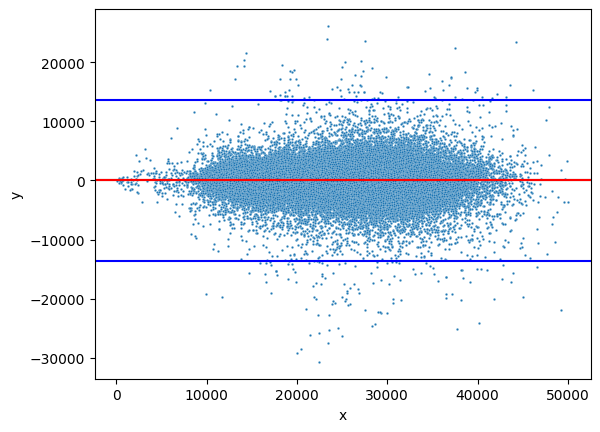

bias_value: 11.542088
loa top: 13660.957126617432
loa bottom: -13637.872951507568


In [ ]:
create_seaborn_plot_bland_altman(df_plot)

In [ ]:
create_bokeh_plot_bland_altman(df_plot.iloc[:100])

bias_value: 247.2075
loa top: 13123.399887084961
loa bottom: -12628.984878540039


## Correlation plot of volumes betweeen left and right segmentations

Correlation plot between left and right segmentations - looking at the volume

In [ ]:
def create_bokeh_correlation_plot(df_plot):

  ########## create bokeh plot with ohif urls

  output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

  # add scatter plot
  l1 = p.circle(x='Value_x_numeric', y='Value_y_numeric', source=df_plot, size=3, alpha=1)

  # add y=x line
  x_min = np.min(df_plot['x'].values)
  x_max = np.max(df_plot['Value_x_numeric'].values)
  y_min = 0
  y_max = np.max(df_plot['Value_y_numeric'].values)
  l2 = p.line([x_min,x_max], [y_min,y_max], color='black')

  # calculate correlation
  r = np.corrcoef(df_plot['Value_x_numeric'].values, df_plot['Value_y_numeric'].values)
  print('correlation is: ' + str(r[0,1]))

  # Add url
  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  # Setup plot titles and such.
  p.title.text = region + ' ' + feature + ' Left vs right correlation'
  p.xaxis.axis_label = 'Left' + feature
  # p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  p.yaxis.axis_label= 'Right' + feature

  # show the plot
  show(p)

  return

In [ ]:
feature = "Volume"
region = "Kidney"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"

In [ ]:
create_bokeh_correlation_plot(df_plot.iloc[:100])

correlation is: 0.9654477027986126


# NLST segmentation consistency over time

In [ ]:
def query_for_stddev(region, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)

  query = f"""

    WITH select_patients AS(

    SELECT
      DISTINCT(clinical_table.sourceSegmentedSeriesUID),
      clinical_table.PatientID,
      clinical_table.StudyInstanceUID,
      dicom_all.StudyDate,
      age,
      gender,
      Value
    FROM
      `{table_id}` as clinical_table
    JOIN
      `bigquery-public-data.idc_current.dicom_all` as dicom_all
    ON
      clinical_table.StudyInstanceUID = dicom_all.StudyInstanceUID
    WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature
    ORDER BY
      clinical_table.PatientID,
      clinical_table.StudyInstanceUID,
      dicom_all.StudyDate
    )

    SELECT
      PatientID,
      ANY_VALUE(StudyInstanceUID) AS StudyInstanceUID, # will get any url though
      ANY_VALUE(gender) as gender,
      STDDEV_POP(Value) AS stddev
    FROM
      select_patients
    GROUP BY
      PatientID;
    """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df



In [ ]:
def create_seaborn_plot_histogram(df_plot, feature, region):

  histogram = sns.histplot(data=df_plot, x="stddev")
  histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' stddev over time for ' + region)

  return

In [ ]:
def create_bokeh_plot_stddev(df_plot, feature, region):


########## create bokeh plot with ohif urls

  output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  #--- create df of the feature we want to plot ---#

  new_column = [np.float32(f) for f in df_plot['Value'].values]
  df_plot['Value_numeric'] = new_column

  # order df_plot according to SeriesDescriptions
  df_plot = df_plot.sort_values(by=['gender']) # want alphabetical order

  SeriesDescriptions_list = list(set(list(df_plot['gender'].values)))
  SeriesDescriptions_list = sorted(SeriesDescriptions_list)
  num_SeriesDescriptions = len(SeriesDescriptions_list)

  #--- Plot using bokeh ---#

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  # Get a color for each region
  colormap, colors = color_list_generator(df_plot, 'gender')
  df_plot['colors'] = colors
  colormap_list_keys = list(colormap.keys())
  SeriesDescriptions = colormap_list_keys

  cats = df_plot.gender.unique()

  colors = list(colormap.values())

  cats2 = []
  for c in range(0,len(cats)):
    cats2.append(cats[c])
    cats2.append(cats[c]+"_boxplot")
  regions = cats2

  colors2 = []
  for c in range(0,len(colors)):
    colors2.append(colors[c])
    colors2.append(colors[c])

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan],
            x_range=regions)

  # l = p.circle(y='Value_numeric', x=jitter('SeriesDescription', width=0.6, range=p.x_range), source=df_plot, alpha=1, color='colors')
  # https://stackoverflow.com/questions/64942935/jitter-in-scatterplot-for-non-numeric-x-axis
  def jitter(x):
      # return x + random.uniform(0, .5) -.25
      # return x + random.uniform(0, 0.5) + 0.5
      return x + random.uniform(0, 0.75) + 0.2
  type_ids = dict()
  for n in range(0,len(colormap_list_keys)):
    type_ids[colormap_list_keys[n]] = (n*2)
  df_plot['gender_id'] = df_plot['gender'].apply(lambda x:type_ids[x])
  df_plot['jitter_type'] = df_plot['gender_id'].apply(lambda x: jitter(x))
  l1 = p.circle(y='Value_numeric',x='jitter_type',source=df_plot, alpha=1, color='colors')

  legend = Legend(items=[LegendItem(label=dict(field="gender"), renderers=[l1])])

  p.add_layout(legend, 'below')

  ### Include the box plots ###
  # find the quartiles and IQR for each category

  df_plot2 = df_plot.copy(deep=True)
  df_plot2['gender2'] = [str(f) + '_boxplot' for f in list(df_plot['gender'].values)]

  # regions are in order we want
  category_gender = pd.api.types.CategoricalDtype(categories=regions, ordered=True)
  df_plot2['gender2'] = df_plot2['gender2'].astype(category_gender)

  groups = df_plot2.groupby('gender2')
  q1 = groups.quantile(q=0.25)
  q2 = groups.quantile(q=0.5)
  q3 = groups.quantile(q=0.75)
  iqr = q3 - q1
  upper = q3 + 1.5*iqr
  lower = q1 - 1.5*iqr

  # Form the source data to call vbar for upper and lower
  # boxes to be formed later.
  upper_source = ColumnDataSource(data=dict(
      x=cats2,
      bottom=q2.Value_numeric,
      top=q3.Value_numeric,
      fill_color=colors2,
      legend=cats2
  ))

  lower_source = ColumnDataSource(data=dict(
      x=cats2,
      bottom=q1.Value_numeric,
      top=q2.Value_numeric,
      fill_color=colors2
  ))


  # stems (Don't need colors of treatment)
  p.segment(cats2, upper.Value_numeric, cats2, q3.Value_numeric, line_color="black")
  p.segment(cats2, lower.Value_numeric, cats2, q1.Value_numeric, line_color="black")

  # Add the upper and lower quartiles
  l=p.vbar(source = upper_source, x='x', width=0.6, bottom='bottom', top='top', fill_color='fill_color', line_color="black")
  p.vbar(source = lower_source, x='x', width=0.6, bottom='bottom', top='top', fill_color='fill_color', line_color="black")

  # whiskers (almost-0 height rects simpler than segments)
  p.rect(cats2, lower.Value_numeric, 0.2, 0.0001, line_color="black")
  p.rect(cats2, upper.Value_numeric, 0.2, 0.0001, line_color="black")

  # Using the newer autogrouped syntax.
  # Grab a renderer, in this case upper quartile and then
  # create the legend explicitly.
  # Guidance from: https://groups.google.com/a/continuum.io/forum/#!msg/bokeh/uEliQlgj390/Jyhsc5HqAAAJ
  # legend = Legend(items=[LegendItem(label=dict(field="x"), renderers=[l])])

  # Setup plot titles and such.
  p.title.text = region + ' ' + feature
  p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  p.xaxis.major_label_text_font_size="0pt"
  p.xaxis.major_label_orientation = np.pi/4
  p.xaxis.axis_label = "M vs F"
  p.yaxis.axis_label= region + ' ' + feature
  # p.legend.location = (100,10)

  p.xaxis.major_tick_line_color = None  # turn off x-axis major ticks
  p.xaxis.minor_tick_line_color = None  # turn off x-axis minor ticks

  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  show(p)

  # output_figures_directory = "/content/figures"
  # if not os.path.isdir(output_figures_directory):
  #   os.mkdir(output_figures_directory)

  # output_figure_filename = os.path.join(output_figures_directory, "figure_5.html")
  # output_file(output_figure_filename,mode='inline')

  return

In [ ]:
region = "Left atrium"
feature = "Volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
df_plot = query_for_stddev(region, feature, table_id, project_name)

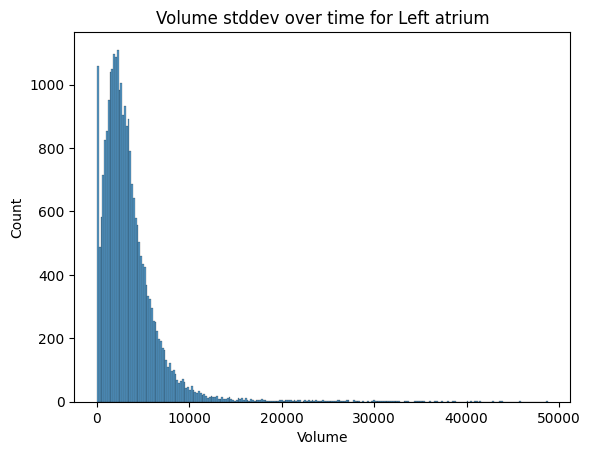

In [ ]:
create_seaborn_plot_histogram(df_plot, feature, region)

In [ ]:
df_plot = df_plot.rename(columns={"stddev": "Value"})
# add the ohif urls
df_plot['viewer_url'] = [None] * len(df_plot)
df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                      f + "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                         for f in df_plot['StudyInstanceUID'].values]


In [ ]:
create_bokeh_plot_stddev(df_plot, feature, region)

<ipython-input-116-5d93837e3df2>:88: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q1 = groups.quantile(q=0.25)
<ipython-input-116-5d93837e3df2>:89: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q2 = groups.quantile(q=0.5)
<ipython-input-116-5d93837e3df2>:90: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q3 = groups.quantile(q=0.75)


median stddev for M: 2997.1131500787556
median stddev for F: 2535.047343169423


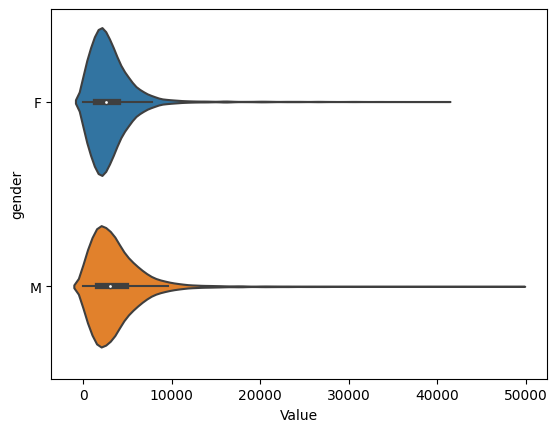

In [ ]:
# Violin plot for differences

sns.violinplot(data=df_plot, x="Value", y="gender")

median_stddev_males = np.median(df_plot[df_plot['gender']=='M']['Value'].values)
median_stddev_females = np.median(df_plot[df_plot['gender']=="F"]['Value'].values)
print('median stddev for M: ' + str(median_stddev_males))
print('median stddev for F: ' + str(median_stddev_females))

Highest point in males -- one study as a series where the entire heart was not scanned, hence the higher variation in values.

# How do the volumes compare to other ground truth datasets

We can compare the distribution of volumes of particular organs to the expert delineations of another dataset.

Since we have the expert delineations in IDC for NSCLC-Radiomics we can compare those. Let's compare the esophagus since that was likely delineated the same way. The heart in NSCLC is not divided into segments, but in TotalSegmentator it is

Plot two histograms of the distributions and do a significance to see if they are not statistically different from each other

NLST

In [ ]:
region = "Esophagus"
feature = "Volume"

In [ ]:
client = bigquery.Client(project=project_name)

query = f"""

  SELECT
     DISTINCT(SOPInstanceUID),
     StudyInstanceUID,
     age,
     gender,
     Value,
     nlst_ctab.sct_ab_desc
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
  JOIN
    `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
  ON
    clinical_table.PatientID = nlst_ctab.pid
  WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature;

  """

job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df_nlst = client.query(query, job_config=job_config).to_dataframe()

NSCLC

In [ ]:
region = "Esophagus"
feature = "Volume of Mesh"

In [ ]:
# Query to get a single feature for all series for a single region

client = bigquery.Client(project=project_name)
table_id = ".".join(['bigquery-public-data', 'idc_current', 'quantitative_measurements'])
print(table_id)

query = f"""
  # Query to get a single feature for all series for a single region

  WITH features AS (
    -- Select the data that includes the volume measurement
    -- Include the series it is derived from and the corresponding region
    SELECT
      sourceSegmentedSeriesUID,
      SOPInstanceUID,
      SeriesDescription,
      -- the region - e.g. heart, trachea, aorta, esophagus
      findingSite.CodeMeaning as region,
      -- the value of the feature of interest
      Value
    FROM
      -- IDC table to query from that holds metadata in the form of quantitative measurements
      `bigquery-public-data.idc_current.quantitative_measurements`
    WHERE
      -- feature to retrieve data for
      Quantity.CodeMeaning = @feature AND
      findingSite.CodeMeaning = @region
  )

  -- Select additional fields from the main dicom_all table, including the portal url
  SELECT
    DISTINCT(features.sourceSegmentedSeriesUID),
    features.SOPInstanceUID,
    dicom_all.StudyInstanceUID,
    dicom_all.PatientID,
    features.SeriesDescription,
    features.region,
    features.Value,
    CONCAT("https://viewer.imaging.datacommons.cancer.gov/viewer/",dicom_all.StudyInstanceUID) as viewer_url

  FROM
    features
  LEFT JOIN
    -- dicom_all is the main IDC table that contains the metadata extracted from the DICOM objects
    `bigquery-public-data.idc_current.dicom_all` as dicom_all
  ON
    -- join the two above temporary tables on this field
    features.sourceSegmentedSeriesUID = dicom_all.SeriesInstanceUID
  WHERE
    -- only include data from the NSCLC collection
    dicom_all.collection_id = "nsclc_radiomics" # AND
    -- we want the original NSCLC data, and our annotations
    # Source_DOI IN("10.5281/zenodo.7539035", "10.5281/zenodo.7975081", "10.7937/K9/TCIA.2015.PF0M9REI")
  ORDER BY
    -- specifies the ordering of the data returned
    dicom_all.PatientID,
    features.sourceSegmentedSeriesUID

"""

job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df_nsclc = client.query(query, job_config=job_config).to_dataframe()

bigquery-public-data.idc_current.quantitative_measurements


Plot histogram of volume values

In [ ]:
df_nlst = df_nlst[['Value']]
df_nlst['collection_id'] = ["NLST"] * len(df_nlst)

df_nsclc = df_nsclc[['Value']]
df_nsclc['collection_id'] = ["NSCLC-Radiomics"] * len(df_nsclc)

In [ ]:
df = pd.concat([df_nlst, df_nsclc])
df['Value2'] = [np.float32(f) for f in df['Value'].values]

Median of expert annotated NSCLC-Radiomics: 40902.28
Median of TotalSegmentator on NLST: 37410.75


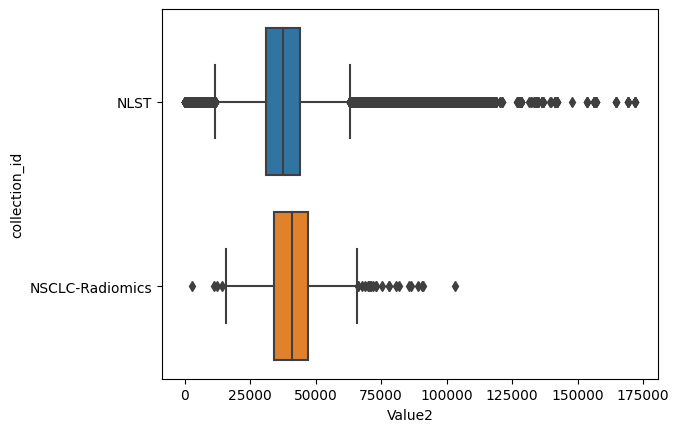

In [ ]:
# Histograms of Volume values
# histogram = sns.histplot(data=df, x="Value", hue="collection_id")
# histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' Esophagus')

boxplot = sns.boxplot(df, x='Value2', y="collection_id")
median_nsclc = np.median(df[df['collection_id']=="NSCLC-Radiomics"]['Value2'].values)
median_nlst = np.median(df[df['collection_id']=="NLST"]['Value2'].values)
print('Median of expert annotated NSCLC-Radiomics: ' + str(median_nsclc))
print('Median of TotalSegmentator on NLST: ' + str(median_nlst))

In [ ]:
# Check if these differences are significant

from scipy.stats import mannwhitneyu

U1, p = mannwhitneyu(df[df['collection_id']=="NSCLC-Radiomics"]['Value2'].values,
                     df[df['collection_id']=="NLST"]['Value2'].values)
print(U1)
print(p)

375784486.5
5.970825882235513e-38


It shows there is a significant difference between the two datasets... but we do not want that.

# Left atrium

Truong QA, Bamberg F, Mahabadi AA, Toepker M, Lee H, Rogers IS, Seneviratne SK, Schlett CL, Brady TJ, Nagurney JT, Hoffmann U. Left atrial volume and index by multi-detector computed tomography: comprehensive analysis from predictors of enlargement to predictive value for acute coronary syndrome (ROMICAT study). International journal of cardiology. 2011 Jan 21;146(2):171-6.

They show:
1. LA volume increases with age
2. LA volume is significantly different between males and females
3. LA volume is significantly different between those with cardiovascular abnormalities and those without. The LA volume should be larger for those with cardiovascular abnormalities.


In [ ]:
region = "Left atrium"
feature = "Volume"
table_id = table_id_126k

In [ ]:
client = bigquery.Client(project=project_name)

query = f"""

  SELECT
     DISTINCT(SOPInstanceUID),
     StudyInstanceUID,
     age,
     gender,
     Value,
     nlst_ctab.sct_ab_desc
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
  JOIN
    `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
  ON
    clinical_table.PatientID = nlst_ctab.pid
  WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature;

  """

job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df = client.query(query, job_config=job_config).to_dataframe()



In [ ]:
df_plot = df.copy(deep=True)
df_plot['CV'] = [0]  * len(df_plot)
# df_plot[df_plot['sct_ab_desc']==60]['CV'] = 1
df_plot['CV'] = [1 if x==60 else 0 for x in df_plot['sct_ab_desc']]

In [ ]:
# First add ohif urls to dataframe
df_plot['viewer_url'] = [None] * len(df_plot)
df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                      f,
                                      "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                         for f in df_plot['StudyInstanceUID'].values]

# https://idc-tester-dk-2-server.web.app/viewer/1.2.840.113654.2.55.222358418596811829743750475747304078456!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series


## 1., 2. LA volume increases with age, and there are significant differences between males and females

The volume of the LA increases with age.

Males have higher Volume compared to Females

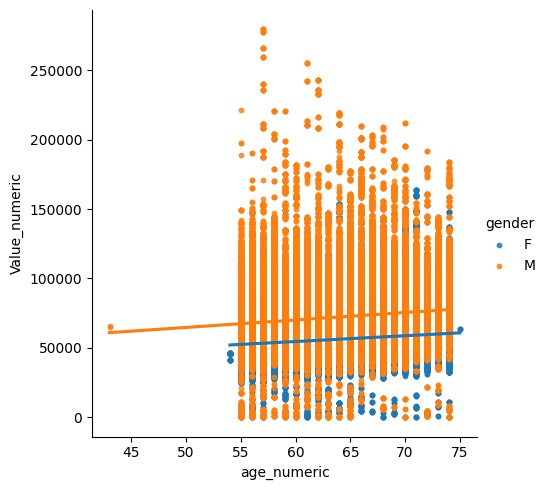

In [ ]:
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column
sns.lmplot(x = "age_numeric", y = "Value_numeric",
           hue = "gender", data = df_plot,
           scatter_kws={"s": 10})

Check for significance between M and F LA volumes.

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_males = df_plot[df_plot['gender'] == "M"]["Value_numeric"].values
df_plot_females = df_plot[df_plot['gender'] == "F"]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_males, df_plot_females)
print(U1)
print(p)


30074304448.5
0.0


P value is low, so there is a significant difference!

In [ ]:
# ########## create bokeh plot with ohif urls

# output_notebook()

# # set the seed so jitter will be the same for each run
# np.random.seed(0)
# random.seed(0)

# #--- create df of the feature we want to plot ---#

# new_column = [np.float32(f) for f in df_plot['Value'].values]
# df_plot['Value_numeric'] = new_column

# colormap, colors = color_list_generator(df_plot, 'gender')
# df_plot['colors'] = colors
# # cats = df_plot.gender.unique()
# cats = list(colormap.keys())
# colors = list(colormap.values())

# # --- scatterplot of age on y axis vs feature on x axis for each gender --- #
# # --- also draw regression lines for each gender --- #

# hover = HoverTool(tooltips=[
#   (''.join(["(",'feature',")"]), "($y)")
# ])

# wZoom = WheelZoomTool()
# bZoom = BoxZoomTool()
# reset = ResetTool()
# tap = TapTool()
# pan = PanTool()

# p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

# # add scatter plot
# l1 = p.circle(x='age', y='Value_numeric', source=df_plot, size=3, alpha=1, color='colors')
# legend = Legend(items=[LegendItem(label=dict(field="gender"), renderers=[l1])])
# p.add_layout(legend, 'below')

# # add best fit line for each of the genders - create dataframe for plotting
# df_plot_with_line = pd.DataFrame()
# for g in range(0,len(colors)):
#   df_plot_line = df_plot[df_plot['gender']==cats[g]]
#   x = np.asarray(df_plot_line['age'].values).astype(np.float32)
#   y = np.asarray(df_plot_line['Value_numeric'].values)
#   par = np.polyfit(x, y, 1, full=True)
#   slope=par[0][0]
#   intercept=par[0][1]
#   y_predicted = [slope*i + intercept  for i in x]
#   # add to dataframe
#   df_plot_line['y_predicted'] = y_predicted
#   # df_plot_with_line = pd.concat([df_plot_with_line, df_plot_line])

#   l2 = p.line(x='age',y='y_predicted',source=df_plot_line, alpha=1, line_color=colors[g])



# # Add url
# url="@viewer_url"
# taptool = p.select(type=TapTool)
# taptool.callback = OpenURL(url=url)

# # Setup plot titles and such.
# p.title.text = 'Age vs ' + region + ' ' + feature
# p.xaxis.axis_label = 'Age'
# # p.xgrid.grid_line_color = None
# p.ygrid.grid_line_color = "white"
# p.grid.grid_line_width = 2
# # p.xaxis.major_label_text_font_size="0pt"
# # p.xaxis.major_label_orientation = np.pi/4
# p.yaxis.axis_label= region + ' ' + feature


# # show the plot
# show(p)


## 3.LA volume is significantly different between those with cardiovascular abnormalities and those without. The LA volume should be larger for those with cardiovascular abnormalities.


There should be a significant difference between CVD and no CVD in Volume.

The ones with CVD should be larger.

median with CVD: 66751.875
median with no CVD: 62122.5


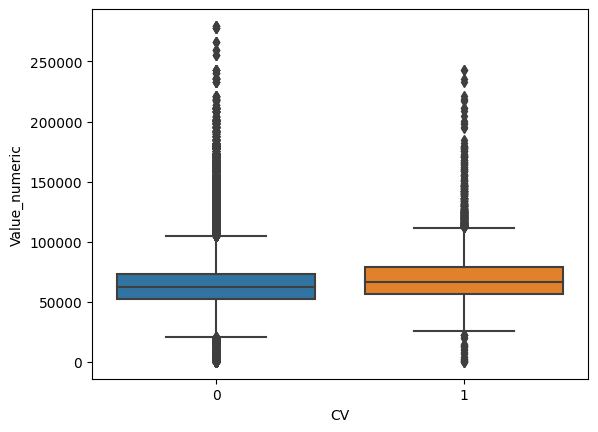

In [ ]:
sns.boxplot(data=df_plot, x="CV", y="Value_numeric")

median_with_CVD = np.median(df_plot[df_plot['CV'] == 1]["Value_numeric"].values)
median_with_no_CVD = np.median(df_plot[df_plot['CV'] == 0]["Value_numeric"].values)

print('median with CVD: ' + str(median_with_CVD))
print('median with no CVD: ' + str(median_with_no_CVD))


Visually, it seems that those with CV issues have larger volumes.

Now let's see if there is a significant difference:

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_males = df_plot[df_plot['CV'] == 1]["Value_numeric"].values
df_plot_females = df_plot[df_plot['CV'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_males, df_plot_females)
print(U1)
print(p)

3015533982.0
2.0314810795289505e-212


There is a significant difference between the LA volumes of patients with significant cardiovascular abnormality, and those without!

# L3 vs age

Duan Y, Turner CH, Kim BT, Seeman E. Sexual dimorphism in vertebral fragility is more the result of gender differences in age‐related bone gain than bone loss. Journal of Bone and Mineral Research. 2001 Dec;16(12):2267-75.


1. The volume of vertebra L3 increases with age
2. The volume of vertebrae should be significantly different between males and females

Volume of L3 increases with age. F = open circles, M = filled circles. Significant differences between the two genders.

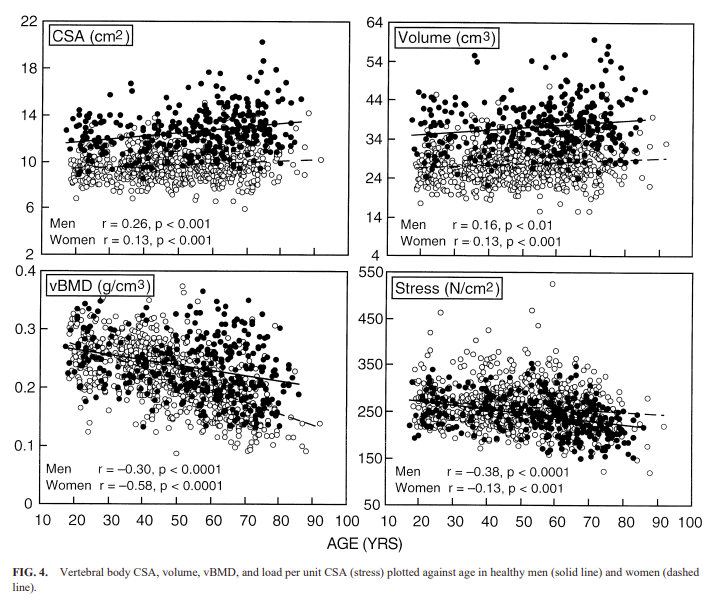

##1.The volume of vertebra L3 increases with age

First let's see how many patients have L3. We might have to pick a vertebrae above, as many might not have been scanned up to L3.

L1 vertebrae = 117138 series

L3 vertebrae = 12343 series

In [ ]:
client = bigquery.Client(project=project_name)

query = f"""

SELECT
    DISTINCT(findingSite.CodeMeaning) AS findingSite_CodeMeaning,
    COUNT(DISTINCT(sourceSegmentedSeriesUID)) AS num_series
FROM
  `{table_id_126k}`
GROUP BY
  findingSite.CodeMeaning
ORDER BY
  findingSite.CodeMeaning;
"""

df = client.query(query).to_dataframe()

In [ ]:
df

,findingSite_CodeMeaning,num_series
0,Adrenal gland,124569
1,Aorta,126050
2,Brain,152
3,C1 vertebra,14
4,C2 vertebra,21
...,...,...
71,Third rib,125780
72,Trachea,125854
73,Twelfth rib,120289
74,Upper lobe of lung,126034


Create plots in seaborn for particular region + feature comparing M and F.

In [ ]:
def create_seaborn_plot_scatterplot_gender(region, feature, table_id):

  client = bigquery.Client(project=project_name)
  print(table_id)

  query = f"""

  SELECT
     DISTINCT(SOPInstanceUID),
     age,
     gender,
     Value
  FROM
    `{table_id}`
  WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature;
  """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  # Histograms of Volume values F vs M
  histogram = sns.histplot(data=df, x="Value", hue="gender")
  histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' M vs F')

  return

Instead of L3 like the paper above, we do L1. As some patients may not have been scanned all the way to L3.

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


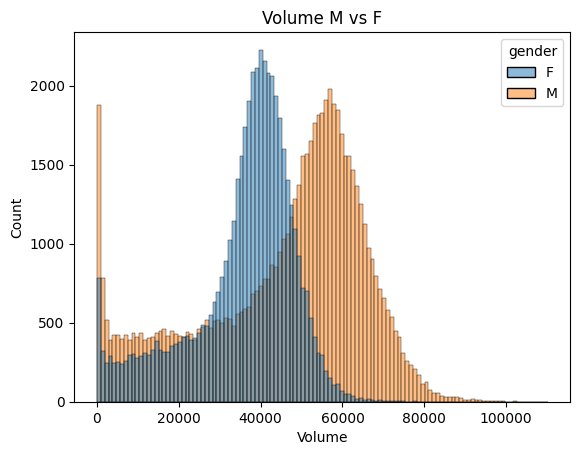

In [ ]:
create_seaborn_plot_scatterplot_gender('L1 vertebra', 'Volume', table_id_126k)

In [ ]:
def create_bokeh_plot_scatterplot_age(region, feature, table_id, viewer_url_string=None):

  client = bigquery.Client(project=project_name)
  print(table_id)

  # if name of table contains 10k, include the viewer_url
  if "10k" in table_id:
    query = f"""
      SELECT
        DISTINCT(SOPInstanceUID),
        StudyInstanceUID,
        PatientID,
        age,
        gender,
        Value,
        viewer_url
      FROM
        `{table_id}`
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature;
    """
    job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
    df_plot = client.query(query, job_config=job_config).to_dataframe()

  elif "126k" in table_id:
    query = f"""
      SELECT
        DISTINCT(SOPInstanceUID),
        StudyInstanceUID,
        PatientID,
        age,
        gender,
        Value
      FROM
        `{table_id}`
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature;
    """
    job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
    df_plot = client.query(query, job_config=job_config).to_dataframe()

    # add on the viewer_urls
    df_plot['viewer_url'] = [None] * len(df_plot)
    df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                          f,
                                          "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                            for f in df_plot['StudyInstanceUID'].values]

  ########## create bokeh plot with ohif urls

  output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  #--- create df of the feature we want to plot ---#

  new_column = [np.float32(f) for f in df_plot['Value'].values]
  df_plot['Value_numeric'] = new_column

  colormap, colors = color_list_generator(df_plot, 'gender')
  df_plot['colors'] = colors
  # cats = df_plot.gender.unique()
  cats = list(colormap.keys())
  colors = list(colormap.values())

  # --- scatterplot of age on y axis vs feature on x axis for each gender --- #
  # --- also draw regression lines for each gender --- #

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

  # add scatter plot
  l1 = p.circle(x='age', y='Value_numeric', source=df_plot, size=3, alpha=1, color='colors')
  legend = Legend(items=[LegendItem(label=dict(field="gender"), renderers=[l1])])
  p.add_layout(legend, 'below')

  # add best fit line for each of the genders - create dataframe for plotting
  df_plot_with_line = pd.DataFrame()
  for g in range(0,len(colors)):
    df_plot_line = df_plot[df_plot['gender']==cats[g]]
    x = np.asarray(df_plot_line['age'].values).astype(np.float32)
    y = np.asarray(df_plot_line['Value_numeric'].values)
    par = np.polyfit(x, y, 1, full=True)
    slope=par[0][0]
    intercept=par[0][1]
    y_predicted = [slope*i + intercept  for i in x]
    # add to dataframe
    df_plot_line['y_predicted'] = y_predicted
    # df_plot_with_line = pd.concat([df_plot_with_line, df_plot_line])

    l2 = p.line(x='age',y='y_predicted',source=df_plot_line, alpha=1, line_color=colors[g])



  # Add url
  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  # Setup plot titles and such.
  p.title.text = 'Age vs ' + region + ' ' + feature
  p.xaxis.axis_label = 'Age'
  # p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  # p.xaxis.major_label_text_font_size="0pt"
  # p.xaxis.major_label_orientation = np.pi/4
  p.yaxis.axis_label= region + ' ' + feature


  # show the plot
  show(p)



  return df_plot


This looks similar to the plot from the paper, similar trend.

In [ ]:
df_plot = create_bokeh_plot_scatterplot_age("L1 vertebra", "Volume", table_id_10k)


idc-external-025.terra.10k-series-data-061023-measurements-clinical-viewer_table_Deepa


In [ ]:
# view for 126k - memory issues

# df_plot = create_bokeh_plot_scatterplot_age("L1 vertebra", "Volume", table_id_126k)


idc-external-025.terra.nlst-126k-measurements-clinical-acquisition
in 126k
created df for 126k


idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


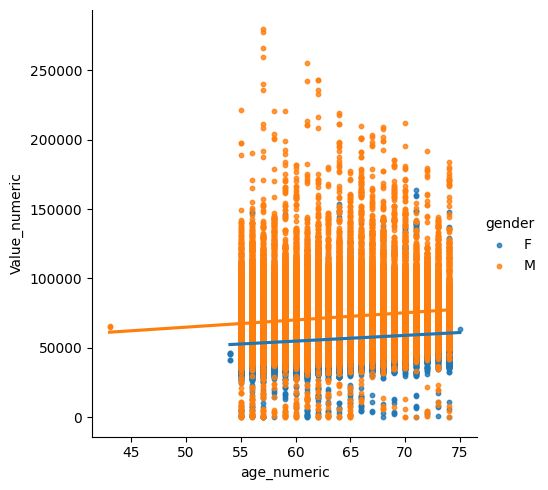

In [ ]:
client = bigquery.Client(project=project_name)
print(table_id)

query = f"""
  SELECT
    DISTINCT(SOPInstanceUID),
    StudyInstanceUID,
    PatientID,
    age,
    gender,
    Value
  FROM
    `{table_id}`
  WHERE
    findingSite.CodeMeaning = @region AND
    Quantity.CodeMeaning = @feature;
"""
job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df_plot = client.query(query, job_config=job_config).to_dataframe()

# add on the viewer_urls
df_plot['viewer_url'] = [None] * len(df_plot)
df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                      f,
                                      "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                        for f in df_plot['StudyInstanceUID'].values]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column
sns.lmplot(x = "age_numeric", y = "Value_numeric",
           hue = "gender", data = df_plot,
          scatter_kws={"s": 10})

## 2.The volume of vertebrae should be significantly different between males and females

There should be a significant difference between M and F

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_males = df_plot[df_plot['gender'] == "M"]["Value_numeric"].values
df_plot_females = df_plot[df_plot['gender'] == "F"]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_males, df_plot_females)
print(U1)
print(p)


15497933.5
1.4060121899580003e-296


The p value is small, so there is a significant difference!

# Lung analysis with emphysema

1. Those with emphysema have larger lung volumes
2. Those with emphysema have a reduction in surface to volume ratio
3. Emphysema is identified by higher percentage of lower attenuation areas
4. There is more thickening of the lumen in airways in those with emphysema - difference in trachea??

1. https://respiratory-research.biomedcentral.com/articles/10.1186/s12931-019-1047-5 Tanabe N, Sato S, Oguma T, Shima H, Sato A, Muro S, Hirai T. Associations of airway tree to lung volume ratio on computed tomography with lung function and symptoms in chronic obstructive pulmonary disease. Respiratory Research. 2019 Dec;20:1-8.

2. https://www.atsjournals.org/doi/epdf/10.1164/ajrccm.159.3.9805067?role=tab Coxson HO, Rogers RM, Whittall KP, D'YACHKOVA YU, Pare PD, Sciurba FC, Hogg JC. A quantification of the lung surface area in emphysema using computed tomography. American journal of respiratory and critical care medicine. 1999 Mar 1;159(3):851-6.

3. https://erj.ersjournals.com/content/18/4/720 Madani A, Keyzer C, Gevenois PA. Quantitative computed tomography assessment of lung structure and function in pulmonary emphysema. European Respiratory Journal. 2001 Oct 1;18(4):720-30.

4. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1994221/pdf/AJRCCM1763243.pdf Martinez FJ, Curtis JL, Sciurba F, Mumford J, Giardino ND, Weinmann G, Kazerooni E, Murray S, Criner GJ, Sin DD, Hogg J. Sex differences in severe pulmonary emphysema. American journal of respiratory and critical care medicine. 2007 Aug 1;176(3):243-52.

other:
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4213995/

## 1.Those with emphysema have larger lung volume

In [ ]:
def query_for_condition(region, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)
  print(table_id)

  query = f"""
    SELECT
      DISTINCT(SOPInstanceUID),
      StudyInstanceUID,
      age,
      gender,
      Value,
      nlst_ctab.sct_ab_desc
    FROM
      `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
    JOIN
      `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
    ON
      clinical_table.PatientID = nlst_ctab.pid
    WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature;

    """
  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


In [ ]:
table_id = table_id_126k
region = "Lower lobe of lung"
feature = "Volume"
df = query_for_condition(region, feature, table_id, project_name)

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


median with emphysema: 1299520.1
median without emphysema: 1285630.9


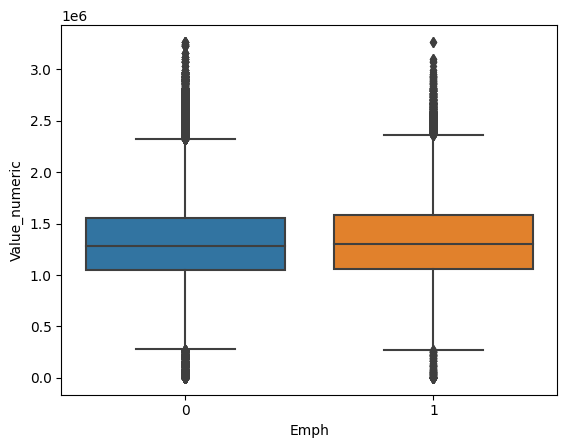

In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

sns.boxplot(data=df_plot, x="Emph", y="Value_numeric")

median_with = np.median(df_plot[df_plot['Emph'] == 1]["Value_numeric"].values)
median_without = np.median(df_plot[df_plot['Emph'] == 0]["Value_numeric"].values)
print ('median with emphysema: ' + str(median_with))
print ('median without emphysema: ' + str(median_without))


In [ ]:
from scipy.stats import mannwhitneyu

df_plot_with = df_plot[df_plot['Emph'] == 1]["Value_numeric"].values
df_plot_without = df_plot[df_plot['Emph'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_with, df_plot_without)
print(U1)
print(p)

39541081068.0
9.072456773251902e-39


There is a significant difference in the lung volume between those with and without emphysema.

## 2.Those with emphysema have a reduction in the surface area to volume ratio

Let's see if there is a reduction in the Surface to volume ratio for those with emphysema compared to those without

In [ ]:
# Lower lobe of lung
# Middle lobe of right lung
# Upper lobe of lung

In [ ]:
table_id = table_id_126k
region = "Upper lobe of lung"
feature = "Surface to volume ratio"
df = query_for_condition(region, feature, table_id, project_name)

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


median with emphysema: 0.068
median without emphysema: 0.069


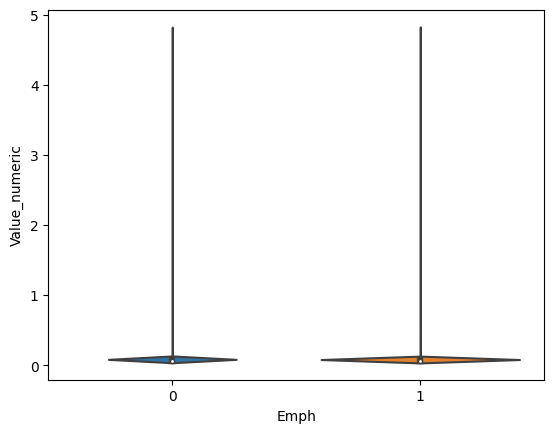

In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

# sns.boxplot(data=df_plot, x="Emph", y="Value_numeric")
sns.violinplot(data=df_plot, x="Emph", y="Value_numeric")

median_with = np.median(df_plot[df_plot['Emph'] == 1]["Value_numeric"].values)
median_without = np.median(df_plot[df_plot['Emph'] == 0]["Value_numeric"].values)

print ('median with emphysema: ' + str(median_with))
print ('median without emphysema: ' + str(median_without))


In [ ]:
from scipy.stats import mannwhitneyu

df_plot_with = df_plot[df_plot['Emph'] == 1]["Value_numeric"].values
df_plot_without = df_plot[df_plot['Emph'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_with, df_plot_without)
print(U1)
print(p)

31313333674.0
0.0


In [ ]:
print(np.mean(df_plot_without))
print(np.mean(df_plot_with))

0.0703302
0.06906892


There is a significant difference in the surface area to volume ratio, though the means/median don't appear too different.

## 3.Emphysema is identified by more lower attenuation areas

Maybe we can check Median or Minimum gray level, so far not sure. Though we are getting significant results.

In [ ]:
# Lower lobe of lung
# Middle lobe of right lung
# Upper lobe of lung

In [ ]:
table_id = table_id_126k
region = "Upper lobe of lung"
# feature = "Minimum grey level"
feature = "Median"
df = query_for_condition(region, feature, table_id, project_name)

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


<Axes: xlabel='Emph', ylabel='Value_numeric'>

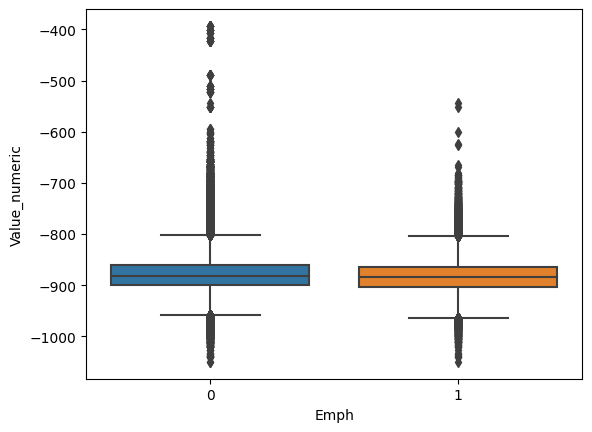

In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

sns.boxplot(data=df_plot, x="Emph", y="Value_numeric")

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_with = df_plot[df_plot['Emph'] == 1]["Value_numeric"].values
df_plot_without = df_plot[df_plot['Emph'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_with, df_plot_without)
print(U1)
print(p)

35557334842.0
0.0


In [ ]:
print(np.median(df_plot_without))
print(np.median(df_plot_with))

-881.15247
-884.8685


## 4.See if the trachea changes shape with emphysema

Let's see if the trachea changes shape too those with emphysema, if there are differences between males and females

In [ ]:
region = "Trachea"
feature = "Volume"

client = bigquery.Client(project=project_name)
print(table_id)

query = f"""
  SELECT
     DISTINCT(SOPInstanceUID),
     StudyInstanceUID,
     age,
     gender,
     Value,
     nlst_ctab.sct_ab_desc
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
  JOIN
    `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
  ON
    clinical_table.PatientID = nlst_ctab.pid
  WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature;

  """
job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df = client.query(query, job_config=job_config).to_dataframe()

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

In [ ]:
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

In [ ]:
df_plot = df_plot[df_plot['Emph']==1]

<Axes: xlabel='gender', ylabel='Value_numeric'>

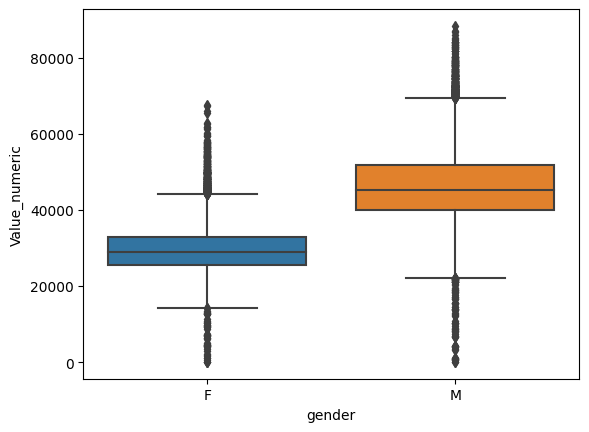

In [ ]:
sns.boxplot(data=df_plot, x="gender", y="Value_numeric")


In [ ]:
df_plot_males_with = df_plot[df_plot['gender']== "M"]["Value_numeric"].values
df_plot_females_with = df_plot[df_plot['gender']== "F"]["Value_numeric"].values

from scipy.stats import mannwhitneyu

U1, p = mannwhitneyu(df_plot_males_with, df_plot_females_with)
print(U1)
print(p)

719026743.5
0.0


Significant differences between males and females for feature for Trachea -- have to do with airway thickening?? Ability of seg?

# Convolutional kernel analysis

1. Features should be stable between sharp and smooth kernels
2. Are there differences in stability between the different manufacturers?
3. Are there differences in stability depending on the type of abnormality?

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8010534/pdf/bjr.20200947.pdf

- For each of the 4 manufacturers, divide into sharp and smooth kernels
- For each study analyze, keep it if it has one series with smooth and one series with sharp. Pick only 1 if more.
- Pick a region - lung lobe.


## Difference between manufacturers

In [ ]:
# Philips, GE, Siemens -- what about Toshiba
sharp_kernels = ['C', 'STANDARD', 'B30f']
smooth_kernels = ['D', 'LUNG', 'B50f']

In [ ]:
def query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id):

  # I only want to include the studies that have series that have both STANDARD and LUNG

  client = bigquery.Client(project=project_name)

  query = f"""

  WITH study_conv1 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel1
  ),

  study_conv2 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel2
  ),

  study_conv_both AS (
    SELECT
      study_conv1.StudyInstanceUID as StudyInstanceUID,
      ANY_VALUE(study_conv1.sourceSegmentedSeriesUID) as series_id_1,
      ANY_VALUE(study_conv2.sourceSegmentedSeriesUID) as series_id_2
    FROM
      study_conv1
    JOIN
      study_conv2
    ON
      study_conv1.StudyInstanceUID = study_conv2.StudyInstanceUID
    GROUP BY
      study_conv1.StudyInstanceUID
  ),

  series_conv_both AS (

    SELECT
      StudyInstanceUID,
      series_id_1 as SeriesInstanceUID
    FROM
      study_conv_both

    UNION ALL

    SELECT
      StudyInstanceUID,
      series_id_2 as SeriesInstanceUID
    FROM
      study_conv_both

  )


  SELECT
    table1.PatientID,
    table1.StudyInstanceUID,
    table1.sourceSegmentedSeriesUID,
    table1.ConvolutionKernel,
    table1.Manufacturer,
    table1.SliceThickness,
    table1.findingSite.CodeMeaning AS findingSite_CodeMeaning,
    table1.Quantity.CodeMeaning AS Quantity_CodeMeaning,
    table1.Value,
    concat("https://idc-tester-dk-2-server.web.app/viewer/",table1.StudyInstanceUID,"!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_sample_061023/dicomStores/10k-series") as viewer_url
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` AS table1
  JOIN
    series_conv_both
  ON
    series_conv_both.SeriesInstanceUID = table1.sourceSegmentedSeriesUID
  WHERE
    table1.findingSite.CodeMeaning = @region AND
    table1.lateralityModifier.CodeMeaning = @laterality AND
    table1.Quantity.CodeMeaning = @feature
  ORDER BY
    table1.PatientID

  """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature),
                                                        bigquery.ScalarQueryParameter("laterality", "STRING", laterality),
                                                        bigquery.ScalarQueryParameter("kernel1", "STRING", kernel1),
                                                        bigquery.ScalarQueryParameter("kernel2", "STRING", kernel2),
                                                        bigquery.ScalarQueryParameter("Manufacturer", "STRING", Manufacturer)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


correlation is: 0.8896978964808886


[Text(0.5, 0, 'Median'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Median ConvolutionKernel')]

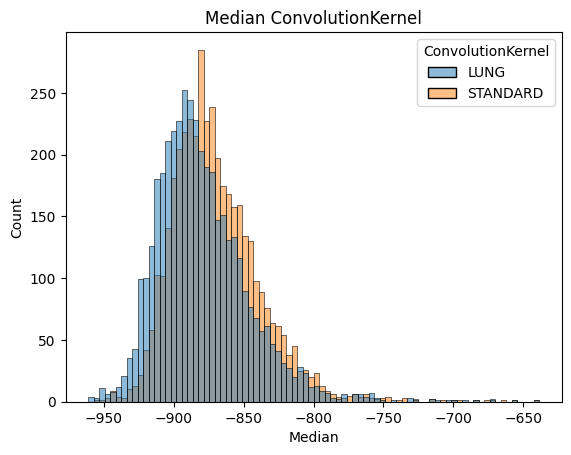

In [ ]:
### GE ###

table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
Manufacturer = "GE MEDICAL SYSTEMS"
kernel1 = 'STANDARD'
kernel2 = 'LUNG'
region = "Upper lobe of lung"
feature = "Median"
laterality = "Left"
df_plot = query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id)

# calculate correlation
# later calculate actual ICC

df_plot["Value_numeric"] = [np.float32(f) for f in df_plot["Value"].values]

r = np.corrcoef(df_plot[df_plot["ConvolutionKernel"]==kernel1]['Value_numeric'].values,
                df_plot[df_plot["ConvolutionKernel"]==kernel2]['Value_numeric'].values)
print('correlation is: ' + str(r[0,1]))

# histogram

histogram = sns.histplot(data=df_plot, x="Value_numeric", hue="ConvolutionKernel")
histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' ConvolutionKernel')

correlation is: 0.9215040083451015


[Text(0.5, 0, 'Median'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Median ConvolutionKernel')]

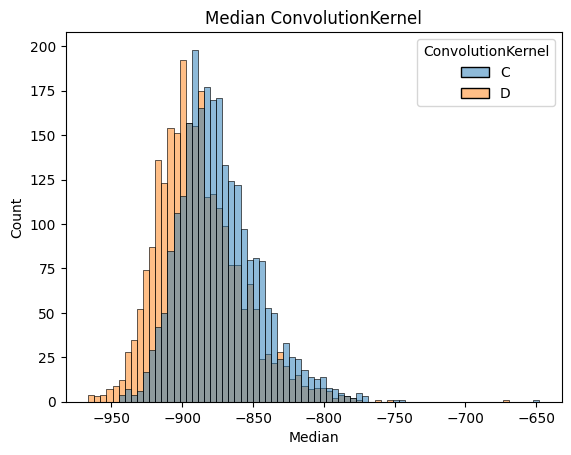

In [ ]:
### Philips ###

table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
Manufacturer = "Philips"
kernel1 = 'C'
kernel2 = 'D'
region = "Upper lobe of lung"
feature = "Median"
laterality = "Left"
df_plot = query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id)

# calculate correlation
# later calculate actual ICC

df_plot["Value_numeric"] = [np.float32(f) for f in df_plot["Value"].values]

r = np.corrcoef(df_plot[df_plot["ConvolutionKernel"]==kernel1]['Value_numeric'].values,
                df_plot[df_plot["ConvolutionKernel"]==kernel2]['Value_numeric'].values)
print('correlation is: ' + str(r[0,1]))

# histogram

histogram = sns.histplot(data=df_plot, x="Value_numeric", hue="ConvolutionKernel")
histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' ConvolutionKernel')

In [ ]:
## Siemens ##

table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
Manufacturer = "SIEMENS"
kernel1 = 'B30f'
kernel2 = 'B50f'
region = "Upper lobe of lung"
feature = "Median"
laterality = "Left"
df_plot = query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id)

# calculate correlation
# later calculate actual ICC

df_plot["Value_numeric"] = [np.float32(f) for f in df_plot["Value"].values]

r = np.corrcoef(df_plot[df_plot["ConvolutionKernel"]==kernel1]['Value_numeric'].values,
                df_plot[df_plot["ConvolutionKernel"]==kernel2]['Value_numeric'].values)
print('correlation is: ' + str(r[0,1]))

# histogram

histogram = sns.histplot(data=df_plot, x="Value_numeric", hue="ConvolutionKernel")
histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' ConvolutionKernel')

ValueError: ignored

## Difference across abnormalities

In [ ]:
def query_for_conv_abnormalities(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id):

  # I only want to include the studies that have series that have both STANDARD and LUNG

  client = bigquery.Client(project=project_name)

  query = f"""

  WITH study_conv1 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel1
  ),

  study_conv2 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel2
  ),

  study_conv_both AS (
    SELECT
      study_conv1.StudyInstanceUID as StudyInstanceUID,
      ANY_VALUE(study_conv1.sourceSegmentedSeriesUID) as series_id_1,
      ANY_VALUE(study_conv2.sourceSegmentedSeriesUID) as series_id_2
    FROM
      study_conv1
    JOIN
      study_conv2
    ON
      study_conv1.StudyInstanceUID = study_conv2.StudyInstanceUID
    GROUP BY
      study_conv1.StudyInstanceUID
  ),

  series_conv_both AS (

    SELECT
      StudyInstanceUID,
      series_id_1 as SeriesInstanceUID
    FROM
      study_conv_both

    UNION ALL

    SELECT
      StudyInstanceUID,
      series_id_2 as SeriesInstanceUID
    FROM
      study_conv_both

  )


  SELECT
    table1.PatientID,
    nlst_ctab.sct_ab_desc,
    table1.StudyInstanceUID,
    table1.sourceSegmentedSeriesUID,
    table1.ConvolutionKernel,
    table1.Manufacturer,
    table1.SliceThickness,
    table1.findingSite.CodeMeaning AS findingSite_CodeMeaning,
    table1.Quantity.CodeMeaning AS Quantity_CodeMeaning,
    table1.Value,
    concat("https://idc-tester-dk-2-server.web.app/viewer/",table1.StudyInstanceUID,"!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_sample_061023/dicomStores/10k-series") as viewer_url
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` AS table1
  JOIN
    series_conv_both
  ON
    series_conv_both.SeriesInstanceUID = table1.sourceSegmentedSeriesUID
  JOIN
    `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
  ON
    table1.PatientID = nlst_ctab.pid
  WHERE
    table1.findingSite.CodeMeaning = @region AND
    table1.lateralityModifier.CodeMeaning = @laterality AND
    table1.Quantity.CodeMeaning = @feature
  ORDER BY
    table1.PatientID

  """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature),
                                                        bigquery.ScalarQueryParameter("laterality", "STRING", laterality),
                                                        bigquery.ScalarQueryParameter("kernel1", "STRING", kernel1),
                                                        bigquery.ScalarQueryParameter("kernel2", "STRING", kernel2),
                                                        bigquery.ScalarQueryParameter("Manufacturer", "STRING", Manufacturer)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


# (IGNORE) Convolutional kernel analysis old

In [ ]:
# SELECT
#   DISTINCT(ConvolutionKernel),
#   COUNT(DISTINCT(sourceSegmentedSeriesUID)) as num_series,
#   Manufacturer
# FROM
#   `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`
# GROUP BY
#   ConvolutionKernel,
#   Manufacturer
# ORDER BY
#   num_series DESC

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8010534/pdf/bjr.20200947.pdf

- For each of the 4 manufacturers, divide into sharp and smooth kernels
- For each study analyzed, we can keep the series that have at least 1 sharp and 1 smooth kernel, pick only 1 if more
- Pick a region - lung lobe, calculate ICC between sharp and smooth kernels across patients for a particular manufacturer
   - now divide across lung abnormality
- Bokeh plot - sharp distribution vs smooth distribution for a particular region, for a particular feature

In [ ]:
# Philips, GE, Siemens -- what about Toshiba
sharp_kernels = ['C', 'STANDARD', 'B30f']
smooth_kernels = ['D', 'LUNG', 'B50f']

In [ ]:
!pip install pandas-gbq

In [ ]:
import pandas_gbq

table_id_conv_explore = "idc-external-018.terra.conv-kernel-explore"

query = f"""

  SELECT
    *
  FROM
    `{table_id_conv_explore}`
"""
df = pandas_gbq.read_gbq(query, project_id=project_name)



Downloading:   3%|▎         |

KeyboardInterrupt: ignored

In [ ]:
set(df['ConvolutionKernel'].values)

In [ ]:
def create_seaborn_plot_conv_kernel_comparison(df):

  histogram = sns.histplot(data=df_plot, x="Value", hue="ConvolutionKernel")
  histogram.set(xlabel = 'ConvolutionKernel', ylabel = "Count", title = 'Upper lobe of lung - for STANDARD vs LUNG kernel for GE')

  return df_plot

In [ ]:
df_plot = df[df['lateralityModifier_CodeMeaning']=='Right']
df_plot = df_plot[df_plot["Quantity_CodeMeaning"]=='Mean']
# Not much difference across both kernels -- shows that this feature (intensity feature) is stable
create_seaborn_plot_conv_kernel_comparison(df_plot)

In [ ]:
# What about across abnormalities?

df_plot = df[df['lateralityModifier_CodeMeaning']=='Right']
df_plot = df_plot[df_plot["Quantity_CodeMeaning"]=='Mean']
df_plot = df_plot[df_plot["sct_ab_desc"]==51]
# Not much difference across both kernels --
create_seaborn_plot_conv_kernel_comparison(df_plot)